<a href="https://colab.research.google.com/github/Erije/SoberSideKick/blob/main/Orientation1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Goal: Predict median_house_value of the houses in california based on other features in the dataset



steps:

1- exploring the dataset

2- pre-process the data

3- engineer custom features

4- train model

5- evaluate the model

In [ ]:
#impoort all needed libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#read file as csv
data_housing = pd.read_csv('housing.csv')
data_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [ ]:
#display fields info type
data_housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [ ]:
#dropping all N\A (empty data) here we have missing rows in total bedrooms
data_housing.dropna(inplace = True)

In [ ]:
#display data to see the current rows after dropping the missing data
data_housing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20433 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20433 non-null  float64
 1   latitude            20433 non-null  float64
 2   housing_median_age  20433 non-null  float64
 3   total_rooms         20433 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20433 non-null  float64
 6   households          20433 non-null  float64
 7   median_income       20433 non-null  float64
 8   median_house_value  20433 non-null  float64
 9   ocean_proximity     20433 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.7+ MB


In [ ]:
#this step is adviced to be done later in the code
from sklearn.model_selection import train_test_split

#split the data on x and y
#x drops the target variable
x = data_housing.drop(['median_house_value'], axis = 1)
#y with the target variable
y = data_housing['median_house_value']

In [ ]:
#splitting data into 80% training data and 20% test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)

In [ ]:
#extra step to join data because of the slip in the upper code
train_data = x_train.join(y_train)

train_data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
14770,-117.07,32.57,17.0,2961.0,634.0,1911.0,615.0,2.5859,NEAR OCEAN,131400.0
14595,-117.16,32.82,28.0,2291.0,371.0,1098.0,382.0,4.6875,NEAR OCEAN,188000.0
4428,-118.22,34.09,40.0,1081.0,282.0,970.0,263.0,1.8750,<1H OCEAN,150000.0
14704,-117.07,32.81,15.0,2000.0,402.0,778.0,369.0,4.3594,<1H OCEAN,224200.0
13291,-117.66,34.07,33.0,2081.0,409.0,1008.0,375.0,2.5870,INLAND,138100.0
...,...,...,...,...,...,...,...,...,...,...
3398,-118.31,34.26,34.0,1797.0,363.0,948.0,363.0,4.1339,<1H OCEAN,187300.0
8294,-118.13,33.76,44.0,1543.0,463.0,652.0,406.0,4.2500,NEAR OCEAN,439300.0
2649,-124.10,40.50,42.0,2380.0,553.0,1300.0,504.0,1.7574,<1H OCEAN,57500.0
4676,-118.34,34.07,52.0,2066.0,319.0,981.0,297.0,5.8632,<1H OCEAN,450000.0


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

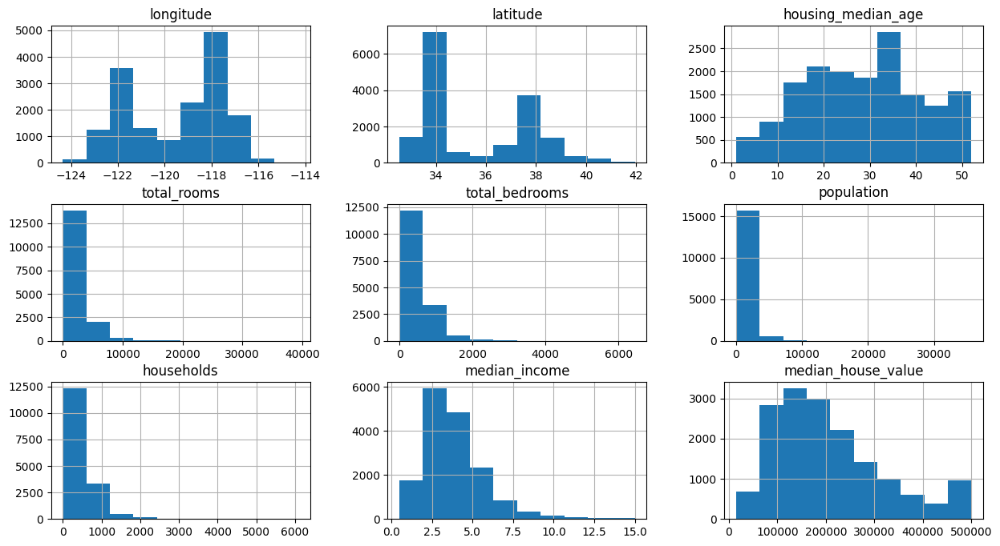

In [ ]:
#find the distribution of the training data for each field
train_data.hist(figsize = (15, 8))

In [ ]:
train_data.corr()
#median_house_value correlates mostly with median income

<ipython-input-55-e717e489fdab>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  train_data.corr()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.925547,-0.117594,0.049156,0.072117,0.102226,0.059083,-0.015329,-0.050668
latitude,-0.925547,1.000000,0.018605,-0.039859,-0.069406,-0.110762,-0.073683,-0.079017,-0.139609
housing_median_age,-0.117594,0.018605,1.000000,-0.361448,-0.322330,-0.294831,-0.304363,-0.121232,0.107142
total_rooms,0.049156,-0.039859,-0.361448,1.000000,0.932053,0.858742,0.920762,0.197050,0.129644
total_bedrooms,0.072117,-0.069406,-0.322330,0.932053,1.000000,0.877447,0.979649,-0.004502,0.049821
population,0.102226,-0.110762,-0.294831,0.858742,0.877447,1.000000,0.907124,0.008535,-0.024800
households,0.059083,-0.073683,-0.304363,0.920762,0.979649,0.907124,1.000000,0.016116,0.064806
median_income,-0.015329,-0.079017,-0.121232,0.197050,-0.004502,0.008535,0.016116,1.000000,0.681944
median_house_value,-0.050668,-0.139609,0.107142,0.129644,0.049821,-0.024800,0.064806,0.681944,1.000000


<ipython-input-56-827f6d3884b4>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(train_data.corr(), annot = True, cmap ="YlGnBu")


<Axes: >

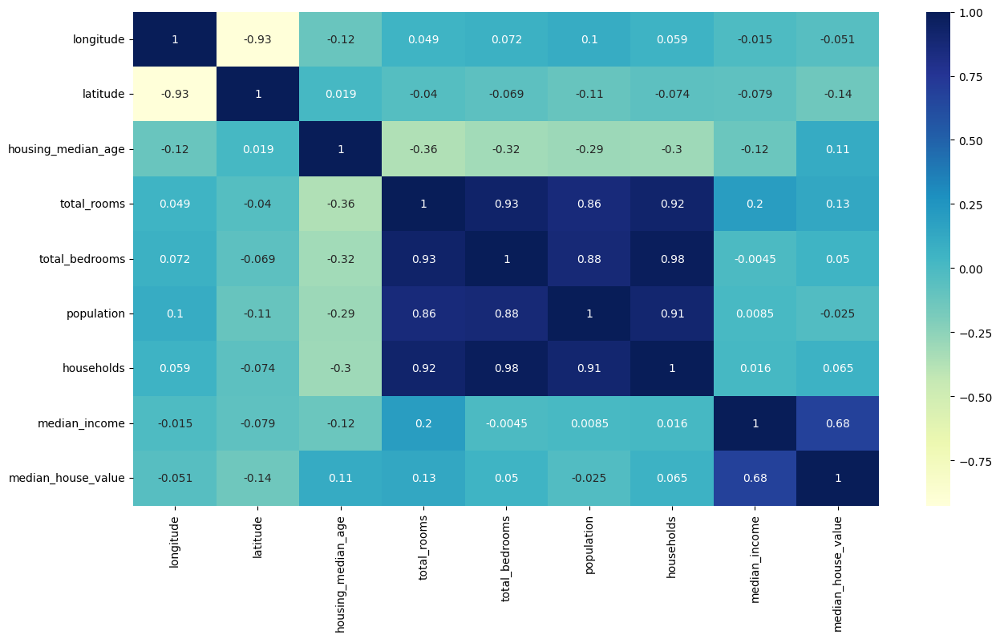

In [ ]:
#diplay the correlation on a heat map
plt.figure(figsize =(15,8))
sns.heatmap(train_data.corr(), annot = True, cmap ="YlGnBu")

In [ ]:
#pass the log function on total rooms / total bedroom / population/ households
train_data['total_rooms'] = np.log(train_data['total_rooms'] + 1)
train_data['total_bedrooms'] = np.log(train_data['total_bedrooms'] + 1)
train_data['population'] = np.log(train_data['population'] + 1)
train_data['households'] = np.log(train_data['households'] + 1)

the log funtion is important here to cancel the exponential distribution in other words to cancel the skewness and bring in a more normal distribution of the above

array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

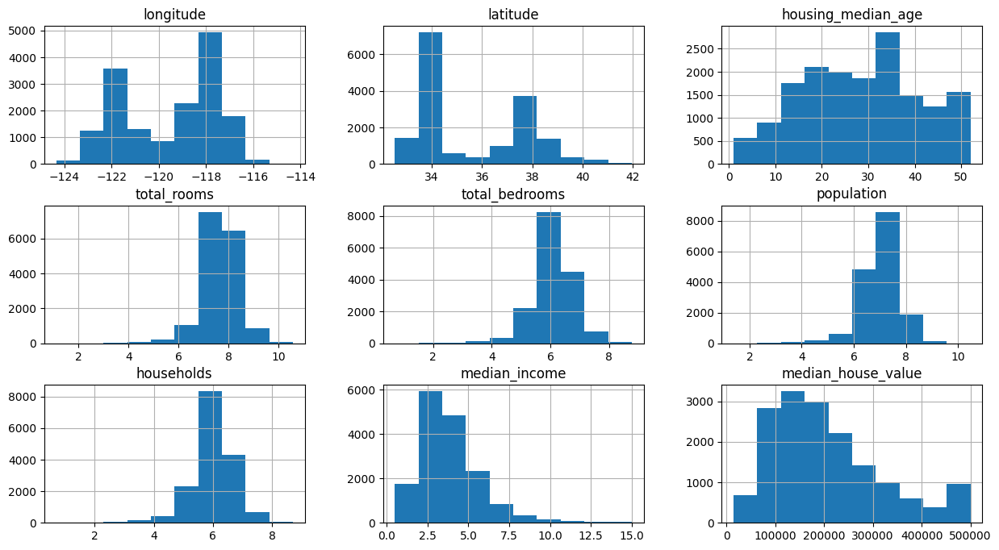

In [ ]:
#display distribution after passing the log function
train_data.hist(figsize = (15,8))

In [ ]:
#count number of values of categorical data on each type
train_data.ocean_proximity.value_counts()

<1H OCEAN     7239
INLAND        5172
NEAR OCEAN    2094
NEAR BAY      1838
ISLAND           3
Name: ocean_proximity, dtype: int64

In [ ]:
#transform categorical data to binary data (binary values are in 0 or 1 format)
train_data = train_data.join(pd.get_dummies(train_data.ocean_proximity)).drop(['ocean_proximity'], axis = 1)
train_data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
14770,-117.07,32.57,17.0,7.993620,6.453625,7.555905,6.423247,2.5859,131400.0,0,0,0,0,1
14595,-117.16,32.82,28.0,7.737180,5.918894,7.002156,5.948035,4.6875,188000.0,0,0,0,0,1
4428,-118.22,34.09,40.0,6.986566,5.645447,6.878326,5.575949,1.8750,150000.0,1,0,0,0,0
14704,-117.07,32.81,15.0,7.601402,5.998937,6.658011,5.913503,4.3594,224200.0,1,0,0,0,0
13291,-117.66,34.07,33.0,7.641084,6.016157,6.916715,5.929589,2.5870,138100.0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3398,-118.31,34.26,34.0,7.494430,5.897154,6.855409,5.897154,4.1339,187300.0,1,0,0,0,0
8294,-118.13,33.76,44.0,7.342132,6.139885,6.481577,6.008813,4.2500,439300.0,0,0,0,0,1
2649,-124.10,40.50,42.0,7.775276,6.317165,7.170888,6.224558,1.7574,57500.0,1,0,0,0,0
4676,-118.34,34.07,52.0,7.633854,5.768321,6.889591,5.697093,5.8632,450000.0,1,0,0,0,0


<Axes: >

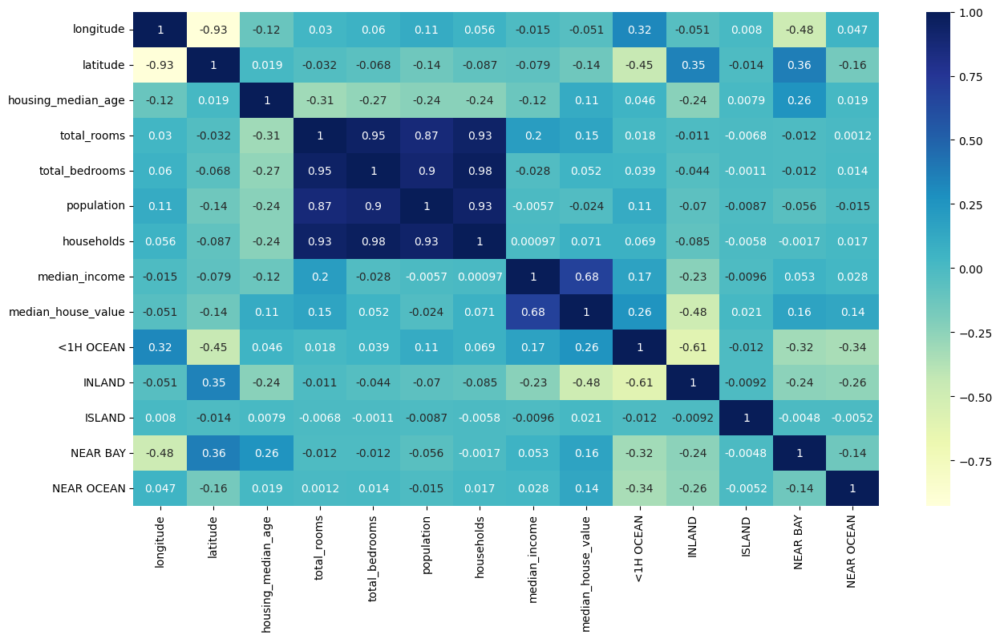

In [ ]:
#display the new correlation
plt.figure(figsize =(15,8))
sns.heatmap(train_data.corr(), annot = True, cmap ="YlGnBu")

the correlation between INLand houses and median_house_value is -0.48 which elaborates that in land houses value is way less then it actually is

<Axes: xlabel='latitude', ylabel='longitude'>

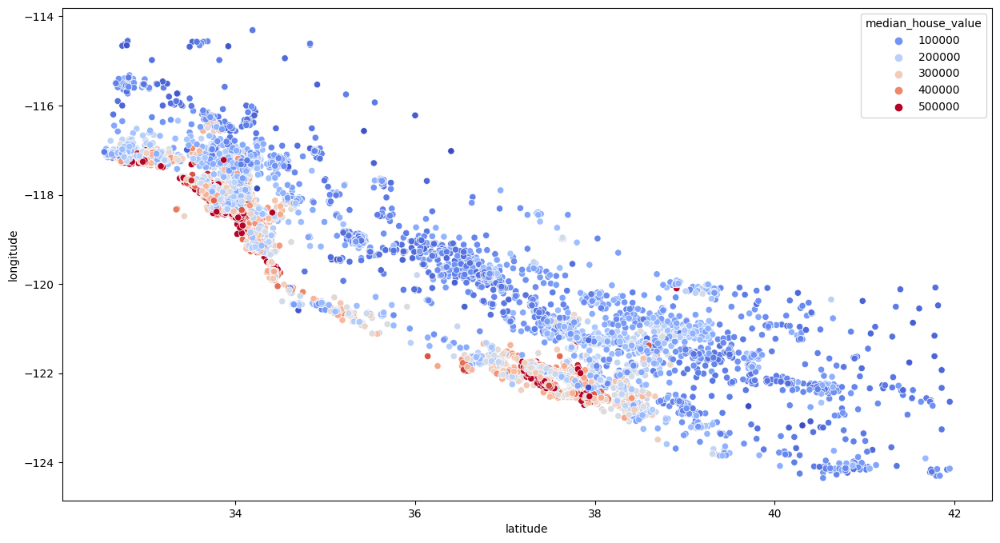

In [ ]:
#display location of the houses
plt.figure(figsize = (15,8))
sns.scatterplot(x = "latitude", y = "longitude", data = train_data, hue = "median_house_value", palette ="coolwarm")

In [ ]:
!pip3 install pip folium matplotlib mapclassify



```
# This is formatted as code
```

Geospatial Addition:

displaying the previous scatterplot on a basemap

In [ ]:
#import libraries
import geopandas as gpd
import pyproj

#transform train_data to GeoDataFrame
geo_train_data = gpd.GeoDataFrame(train_data, geometry=gpd.points_from_xy(train_data['longitude'],train_data['latitude']))
#add valid coordinate systems
geo_train_data = geo_train_data.set_crs('epsg:4326')
geo_train_data.crs

#diplay map with explore
geo_train_data.explore(column ='median_house_value' ,cmap='YlOrRd')


the above map graph shows that the closer to the coast the houses are, the  higher the prices will be.

Step3:
-Feature engineering:

interesting feature according to correlation : total rooms, total bedrooms, Household

we can create a ratio of:

-number of bedrooms per room

-number of rooms per household



<Axes: >

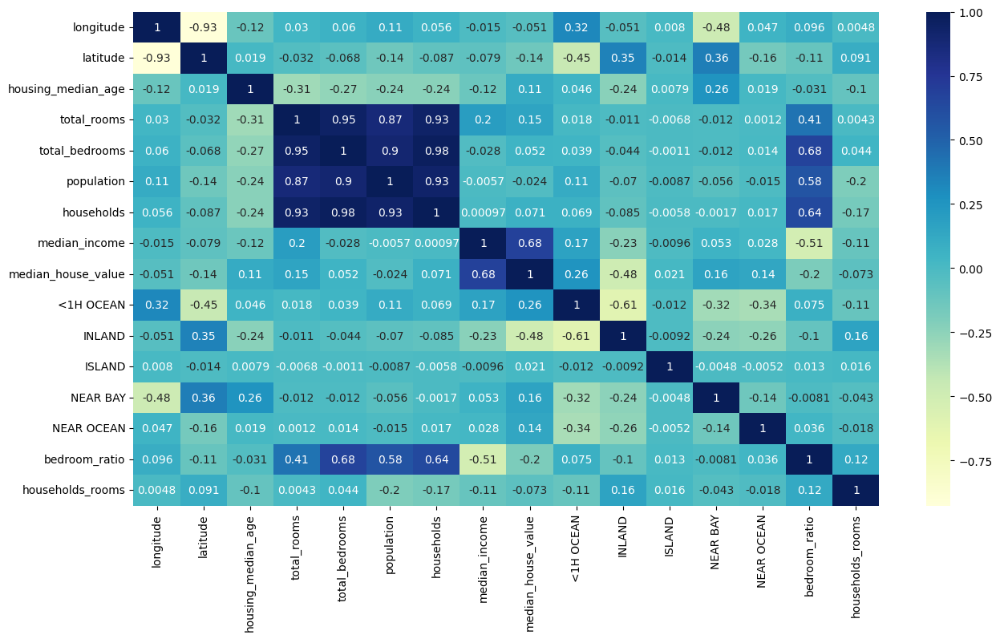

In [ ]:
# total_bedrooms, total_rooms and households are the fields we are going to consider because of correlation
train_data['bedroom_ratio']= train_data['total_bedrooms'] / train_data['total_rooms']
train_data['households_rooms'] = train_data['total_bedrooms'] / train_data['households']

plt.figure(figsize =(15,8))
sns.heatmap(train_data.corr(), annot = True, cmap ="YlGnBu")

correlation between bedroom ratio and median_house_value is -0.2

correlation between households_rooms and median_house_value is -0.073

In [ ]:
x_train

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
14770,-117.07,32.57,17.0,2961.0,634.0,1911.0,615.0,2.5859,NEAR OCEAN
14595,-117.16,32.82,28.0,2291.0,371.0,1098.0,382.0,4.6875,NEAR OCEAN
4428,-118.22,34.09,40.0,1081.0,282.0,970.0,263.0,1.8750,<1H OCEAN
14704,-117.07,32.81,15.0,2000.0,402.0,778.0,369.0,4.3594,<1H OCEAN
13291,-117.66,34.07,33.0,2081.0,409.0,1008.0,375.0,2.5870,INLAND
...,...,...,...,...,...,...,...,...,...
3398,-118.31,34.26,34.0,1797.0,363.0,948.0,363.0,4.1339,<1H OCEAN
8294,-118.13,33.76,44.0,1543.0,463.0,652.0,406.0,4.2500,NEAR OCEAN
2649,-124.10,40.50,42.0,2380.0,553.0,1300.0,504.0,1.7574,<1H OCEAN
4676,-118.34,34.07,52.0,2066.0,319.0,981.0,297.0,5.8632,<1H OCEAN


Linear Regression Model



why do we use the scaler?

we use the scaler to improve the performance of the algorithm through estimating the empirical mean and standard deviation of the data.

it also requires the data to be normally distributed for it to work properly

In [ ]:
#linear regression model

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

#scaler to scale data
scaler = StandardScaler()

x_train, y_train = train_data.drop(['median_house_value'], axis = 1), train_data['median_house_value']
x_train_s = scaler.fit_transform(x_train)

reg = LinearRegression()

reg.fit(x_train_s, y_train)

LinearRegression()

In [ ]:
#doing the same above steps on the test data
test_data = x_test.join(y_test)

train_data['total_rooms'] = np.log(test_data['total_rooms'] + 1)
train_data['total_bedrooms'] = np.log(test_data['total_bedrooms'] + 1)
train_data['population'] = np.log(test_data['population'] + 1)
train_data['households'] = np.log(test_data['households'] + 1)

test_data = test_data.join(pd.get_dummies(test_data.ocean_proximity)).drop(['ocean_proximity'], axis = 1)

test_data['bedroom_ratio']= test_data['total_bedrooms'] / test_data['total_rooms']
test_data['households_rooms'] = test_data['total_bedrooms'] / test_data['households']


we dropped the ocean_proximity column in the above code because we transformed all the types of categorical data in that column to binary data. thanks to the get_dummies every category have its own column showing 0 if it does not exist and 1 is it does for each house

so we do no need it in that form anymore that is why we drop it

In [ ]:
x_test, y_test = test_data.drop(['median_house_value'], axis = 1), test_data['median_house_value']


In [ ]:
test_data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,bedroom_ratio,households_rooms
10925,-117.89,33.75,31.0,1205.0,280.0,1476.0,301.0,4.0231,139200.0,1,0,0,0,0,0.232365,0.930233
5177,-118.25,33.95,35.0,1405.0,326.0,1086.0,273.0,1.0375,89800.0,1,0,0,0,0,0.232028,1.194139
18888,-122.24,38.11,42.0,1743.0,388.0,889.0,341.0,2.3241,99200.0,0,0,0,1,0,0.222605,1.137830
9979,-122.27,38.68,18.0,742.0,142.0,343.0,119.0,3.1563,98400.0,0,1,0,0,0,0.191375,1.193277
6574,-118.16,34.20,43.0,1810.0,343.0,988.0,307.0,3.8203,176000.0,1,0,0,0,0,0.189503,1.117264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5894,-118.32,34.16,49.0,1074.0,170.0,403.0,208.0,6.2547,366700.0,1,0,0,0,0,0.158287,0.817308
17520,-121.91,37.33,52.0,2562.0,410.0,973.0,398.0,4.8854,330600.0,1,0,0,0,0,0.160031,1.030151
19326,-122.94,38.50,46.0,2280.0,492.0,807.0,366.0,2.6316,117000.0,1,0,0,0,0,0.215789,1.344262
10157,-117.97,33.91,19.0,8096.0,1318.0,3853.0,1313.0,6.0076,269500.0,1,0,0,0,0,0.162796,1.003808


In [ ]:
#scale data
x_test_s = scaler.fit_transform(x_test)


In [ ]:
#testing the regression model with the test data
reg.score(x_test_s, y_test)

0.62724584409748

the score was 0.627 which is not the ideal match

Create new model with Ramdom forest Regressor that is known to be more powerful

In [ ]:
#train and test data with more powerful model Ramdom Forest Regressor

#import library
from sklearn.ensemble import RandomForestRegressor

#call the model
forest = RandomForestRegressor()
forest.fit(x_train_s, y_train)

RandomForestRegressor()

In [ ]:
forest.score(x_test_s, y_test)

0.7195429452107676

the score was 0.719 which is a higher score than the regression model but still not ideal

In [ ]:

#from seaborn.matrix import Grid
#from sklearn.model_selection import GridSearchCV

#forest = RandomForestRegressor()

#param_grid ={
    #"n_estimators":[3, 10, 30],
    #"max_features":[2, 4, 6, 8]
#}

#grid_search = GridSearchCV(forest, param_grid, cv=5,
                           # scoring = "neg_mean_squared_error",
                           # return_train_score = True)

#grid_search.fit(x_train, y_train)

In [ ]:
#best_forest = grid_search.best_estimator_

In [ ]:
#best_forest.score(x_test, y_test)

Adding a paramater grid search with cross validation*

Cross validation*: split data into K number of folds
you would use K-1 folds for training and 1 fold for testing or evaluating


In [ ]:
from seaborn.matrix import Grid
from sklearn.model_selection import GridSearchCV

#call the model
forest = RandomForestRegressor()

param_grid ={
    "n_estimators":[100, 200, 300],
    "min_samples_split":[2, 4],
    "max_depth":[None, 4,8]
}

grid_search = GridSearchCV(forest, param_grid, cv=5,
                            scoring = "neg_mean_squared_error",
                            return_train_score = True)

grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 4, 8], 'min_samples_split': [2, 4],
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, scoring='neg_mean_squared_error')

what is the role of the parameters in param grid?

n_estimatorss: his parameter specifies the number of decision trees in a random forest ensemble.

min_samples_split: This parameter defines the minimum number of samples required to split an internal node during tree building.

max_depth: This parameter determines the maximum depth of each decision tree.

In [ ]:
best_forest = grid_search.best_estimator_

we call .best_estimator_ to get the optimal hyper parameter after the model trys all the different combination.

In [ ]:
best_forest.score(x_test, y_test )

0.5016361279595041

the score was 0.501 which is a worse performance so the most accurate model in this case is Random Forest Regressor without the grid search